In [165]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

plt.style.use('fivethirtyeight')
pd.set_option('max_column', 500)

# color_pal = plt.rcParams["axes.prop_cycle"].by_key()["color"]

OptionError: 'Pattern matched multiple keys'

In [3]:
# api for fredapi
!pip install fredapi

In [5]:
from fredapi import Fred

freadapi_key = 'ENTER API_KEY'

In [6]:
# create fred obj
fred = Fred(api_key=freadapi_key)
# api = https://api.stlouisfed.org/fred/series/search?api_key=

In [7]:
# search dor economic data
sp_search = fred.search('S&P', order_by='popularity')
sp_search.head()

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
BAMLH0A0HYM2,BAMLH0A0HYM2,2024-05-21,2024-05-21,ICE BofA US High Yield Index Option-Adjusted S...,1996-12-31,2024-05-17,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2024-05-20 07:51:09-05:00,92,The ICE BofA Option-Adjusted Spreads (OASs) ar...
CSUSHPINSA,CSUSHPINSA,2024-05-21,2024-05-21,S&P CoreLogic Case-Shiller U.S. National Home ...,1987-01-01,2024-02-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Not Seasonally Adjusted,NSA,2024-04-30 08:12:01-05:00,88,"For more information regarding the index, plea..."
SP500,SP500,2024-05-21,2024-05-21,S&P 500,2014-05-21,2024-05-20,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2024-05-20 19:11:07-05:00,83,The observations for the S&P 500 represent the...
MEHOINUSA672N,MEHOINUSA672N,2024-05-21,2024-05-21,Real Median Household Income in the United States,1984-01-01,2022-01-01,Annual,A,2022 CPI-U-RS Adjusted Dollars,2022 CPI-U-RS Adjusted $,Not Seasonally Adjusted,NSA,2023-09-12 13:48:02-05:00,83,Household data are collected as of March. As ...
BAMLH0A0HYM2EY,BAMLH0A0HYM2EY,2024-05-21,2024-05-21,ICE BofA US High Yield Index Effective Yield,1996-12-31,2024-05-17,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2024-05-20 07:51:12-05:00,82,This data represents the effective yield of th...


In [8]:
# pull raw data
sp500 = fred.get_series(series_id='SP500')
sp500

2014-05-21    1888.03
2014-05-22    1892.49
2014-05-23    1900.53
2014-05-26        NaN
2014-05-27    1911.91
               ...   
2024-05-14    5246.68
2024-05-15    5308.15
2024-05-16    5297.10
2024-05-17    5303.27
2024-05-20    5308.13
Length: 2609, dtype: float64

<AxesSubplot:title={'center':'S&P 500'}>

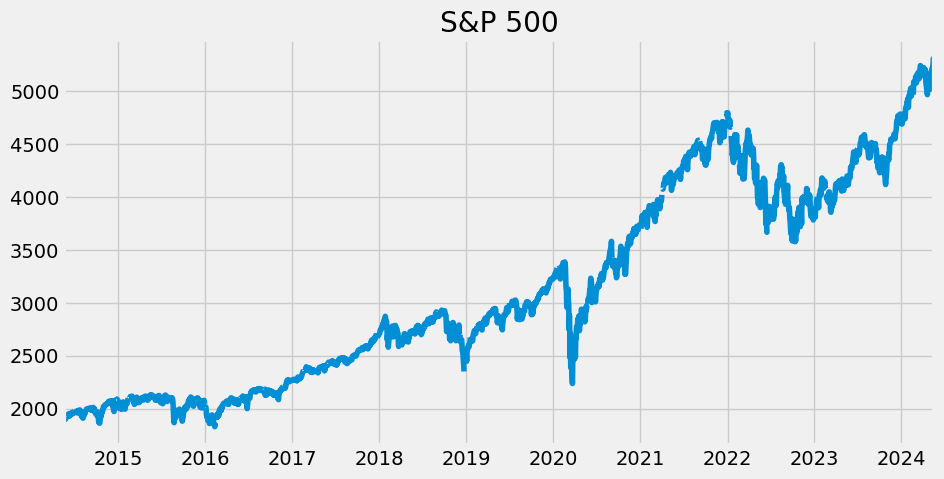

In [9]:
sp500.plot(figsize=(10,5), title='S&P 500')

In [10]:
# pull and join multiple data series
unemp_results = fred.search('unemployement')
unemp_results

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-05-21,2024-05-21,Unemployment Rate,1948-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-03 07:45:01-05:00,95,The unemployment rate represents the number of...
UNRATENSA,UNRATENSA,2024-05-21,2024-05-21,Unemployment Rate,1948-01-01,2024-04-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-05-03 07:45:27-05:00,58,The unemployment rate represents the number of...
UNEMPLOY,UNEMPLOY,2024-05-21,2024-05-21,Unemployment Level,1948-01-01,2024-04-01,Monthly,M,Thousands of Persons,Thous. of Persons,Seasonally Adjusted,SA,2024-05-03 07:45:20-05:00,71,The series comes from the 'Current Population ...
NROU,NROU,2024-05-21,2024-05-21,Noncyclical Rate of Unemployment,1949-01-01,2034-10-01,Quarterly,Q,Percent,%,Not Seasonally Adjusted,NSA,2024-02-08 14:46:04-06:00,69,"Starting with the July, 2021 report: An Update..."
CCSA,CCSA,2024-05-21,2024-05-21,Continued Claims (Insured Unemployment),1967-01-07,2024-05-04,"Weekly, Ending Saturday",W,Number,Number,Seasonally Adjusted,SA,2024-05-16 10:00:05-05:00,74,"Continued claims, also referred to as insured ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LAUCN340030000000003A,LAUCN340030000000003A,2024-05-21,2024-05-21,"Unemployment Rate in Bergen County, NJ",1990-01-01,2023-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2024-05-01 10:48:38-05:00,0,These data come from the Current Population Su...
LMUNRRTTLUM156S,LMUNRRTTLUM156S,2024-05-21,2024-05-21,Infra-Annual Registered Unemployment and Job V...,1995-01-01,2023-12-01,Monthly,M,Growth rate previous period,Growth rate previous period,Seasonally Adjusted,SA,2024-04-10 11:07:38-05:00,5,OECD Data Filters: REF_AREA: LUX MEASURE: REG...
LNS14000315,LNS14000315,2024-05-21,2024-05-21,Unemployment Rate - Married Women,1955-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-03 07:46:28-05:00,9,To obtain estimates of women worker employment...


In [43]:
unrate = fred.get_series('UNRATE')

1948-01-01    3.4
1948-02-01    3.8
1948-03-01    4.0
1948-04-01    3.9
1948-05-01    3.5
             ... 
2023-12-01    3.7
2024-01-01    3.7
2024-02-01    3.9
2024-03-01    3.8
2024-04-01    3.9
Length: 916, dtype: float64

<AxesSubplot:>

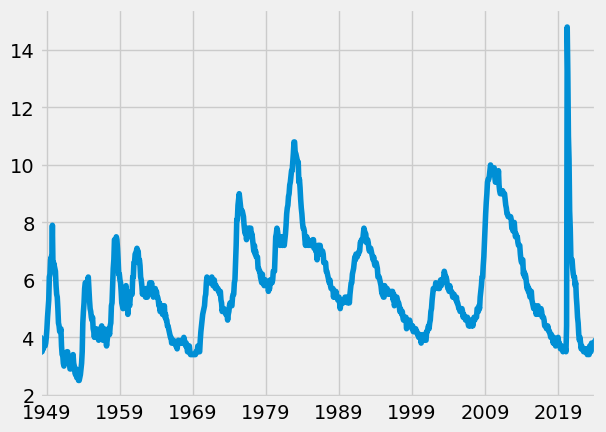

In [16]:
unrate.plot()

In [11]:
unemp_df = fred.search('unemployement rate state', filter=('frequency', 'Monthly'))

In [12]:
unemp_df = unemp_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"' )
unemp_df.head()

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-05-21,2024-05-21,Unemployment Rate,1948-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-03 07:45:01-05:00,95,The unemployment rate represents the number of...
LNS14000006,LNS14000006,2024-05-21,2024-05-21,Unemployment Rate - Black or African American,1972-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-03 07:45:19-05:00,72,The series comes from the 'Current Population ...
U6RATE,U6RATE,2024-05-21,2024-05-21,"Total Unemployed, Plus All Persons Marginally ...",1994-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-03 07:45:23-05:00,67,The series comes from the 'Current Population ...
CAUR,CAUR,2024-05-21,2024-05-21,Unemployment Rate in California,1976-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-20 08:14:01-05:00,64,None
TXUR,TXUR,2024-05-21,2024-05-21,Unemployment Rate in Texas,1976-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-20 08:13:02-05:00,56,None


In [13]:
unemp_df = unemp_df.loc[unemp_df['title'].str.contains('Unemployment Rate')]

In [14]:
unemp_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-05-21,2024-05-21,Unemployment Rate,1948-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-03 07:45:01-05:00,95,The unemployment rate represents the number of...
LNS14000006,LNS14000006,2024-05-21,2024-05-21,Unemployment Rate - Black or African American,1972-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-03 07:45:19-05:00,72,The series comes from the 'Current Population ...
CAUR,CAUR,2024-05-21,2024-05-21,Unemployment Rate in California,1976-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-20 08:14:01-05:00,64,None
TXUR,TXUR,2024-05-21,2024-05-21,Unemployment Rate in Texas,1976-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-20 08:13:02-05:00,56,None
M0892AUSM156SNBR,M0892AUSM156SNBR,2024-05-21,2024-05-21,Unemployment Rate for United States,1929-04-01,1942-06-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2012-08-17 14:26:06-05:00,54,Series Is Presented Here As Three Variables--(...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LNS14000048,LNS14000048,2024-05-21,2024-05-21,Unemployment Rate - 25 Yrs. & over,1948-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-03 07:46:30-05:00,6,The series comes from the 'Current Population ...
LNS14000089,LNS14000089,2024-05-21,2024-05-21,Unemployment Rate - 25-34 Yrs.,1948-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-03 07:46:35-05:00,6,The series comes from the 'Current Population ...
M08311USM156SNBR,M08311USM156SNBR,2024-05-21,2024-05-21,"Unemployment Rate, Married Males, Spouse Prese...",1954-11-01,1968-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2012-08-17 14:28:17-05:00,6,Beginning In 1960 Data Include Alaska And Hawa...


In [15]:
unemp_df.index

Index(['UNRATE', 'LNS14000006', 'CAUR', 'TXUR', 'M0892AUSM156SNBR',
       'LNS14000024', 'LNS14000031', 'M0892BUSM156SNBR', 'NYUR', 'U2RATE',
       'FLUR', 'LNS14000002', 'LNS14000009', 'LNS14000003', 'PAUR', 'OHUR',
       'LNS14000001', 'LNS14027660', 'MIUR', 'LNS14027662', 'ALUR',
       'LNS14024887', 'MAUR', 'NCUR', 'ILUR', 'NJUR', 'GAUR', 'COUR', 'AZUR',
       'WIUR', 'VAUR', 'KYUR', 'LRUN64TTUSM156S', 'SCUR', 'NMUR', 'MNUR',
       'TNUR', 'LNS14032183', 'LNS14000012', 'WAUR', 'LNS14027659', 'MDUR',
       'ORUR', 'WVUR', 'NVUR', 'ARUR', 'OKUR', 'MOUR', 'AKUR', 'IAUR', 'UTUR',
       'PRUR', 'INUR', 'LAUR', 'HIUR', 'LASMT261982000000003', 'NDUR', 'MTUR',
       'DCUR', 'MSUR', 'LNS14000060', 'LNS14000028', 'MEUR', 'NEUR',
       'LASMT391746000000003', 'CTUR', 'IDUR', 'NHUR', 'LNS14000018', 'RIUR',
       'KSUR', 'WYUR', 'DEUR', 'LNS14000036', 'VTUR', 'LNS14000032', 'SDUR',
       'CMWRUR', 'LNS14200000', 'LRUN24TTUSM156S', 'LNS14027689',
       'LNS14100000', 'LNS14000315', 

In [25]:
all_results = []
for myid in unemp_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)
    

In [26]:
all_results[1]

,LNS14000006
1972-01-01,11.2
1972-02-01,11.2
1972-03-01,10.7
1972-04-01,9.8
1972-05-01,10.2
...,...
2023-12-01,5.2
2024-01-01,5.3
2024-02-01,5.6
2024-03-01,6.4


In [37]:
# concat all data
unemp_results = pd.concat(all_results, axis=1)
unemp_results

,UNRATE,LNS14000006,CAUR,TXUR,M0892AUSM156SNBR,LNS14000024,LNS14000031,M0892BUSM156SNBR,NYUR,U2RATE,...,CNERUR,LRUNTTTTUSM156S,CWSTUR,CNEWUR,LNS14000026,LNS14000048,LNS14000089,M08311USM156SNBR,LNS14000150,LRUN25TTUSM156S
1929-04-01,NaN,NaN,NaN,NaN,0.69,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-05-01,NaN,NaN,NaN,NaN,1.65,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-06-01,NaN,NaN,NaN,NaN,2.06,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-07-01,NaN,NaN,NaN,NaN,0.79,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-08-01,NaN,NaN,NaN,NaN,0.04,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,3.7,5.2,5.1,3.9,NaN,3.4,4.6,NaN,4.6,1.8,...,4.0,3.7,4.5,3.3,3.3,3.2,4.2,NaN,2.1,3.3
2024-01-01,3.7,5.3,5.2,3.9,NaN,3.4,5.3,NaN,4.5,1.8,...,4.0,3.7,4.6,3.4,3.2,3.2,3.9,NaN,2.1,3.3
2024-02-01,3.9,5.6,5.3,3.9,NaN,3.5,6.1,NaN,4.4,1.9,...,4.0,3.9,4.6,3.4,3.5,3.2,4.3,NaN,1.9,3.3
2024-03-01,3.8,6.4,5.3,3.9,NaN,3.5,6.2,NaN,4.3,1.8,...,3.9,3.8,4.6,3.3,3.6,3.1,4.1,NaN,1.8,3.2


In [60]:
# droping not needed dataseries like L..., M...
# For safe working making a copy
unemp_results_copy = unemp_results.copy()
unemp_results_copy

,UNRATE,LNS14000006,CAUR,TXUR,M0892AUSM156SNBR,LNS14000024,LNS14000031,M0892BUSM156SNBR,NYUR,U2RATE,...,CNERUR,LRUNTTTTUSM156S,CWSTUR,CNEWUR,LNS14000026,LNS14000048,LNS14000089,M08311USM156SNBR,LNS14000150,LRUN25TTUSM156S
1929-04-01,NaN,NaN,NaN,NaN,0.69,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-05-01,NaN,NaN,NaN,NaN,1.65,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-06-01,NaN,NaN,NaN,NaN,2.06,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-07-01,NaN,NaN,NaN,NaN,0.79,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-08-01,NaN,NaN,NaN,NaN,0.04,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,3.7,5.2,5.1,3.9,NaN,3.4,4.6,NaN,4.6,1.8,...,4.0,3.7,4.5,3.3,3.3,3.2,4.2,NaN,2.1,3.3
2024-01-01,3.7,5.3,5.2,3.9,NaN,3.4,5.3,NaN,4.5,1.8,...,4.0,3.7,4.6,3.4,3.2,3.2,3.9,NaN,2.1,3.3
2024-02-01,3.9,5.6,5.3,3.9,NaN,3.5,6.1,NaN,4.4,1.9,...,4.0,3.9,4.6,3.4,3.5,3.2,4.3,NaN,1.9,3.3
2024-03-01,3.8,6.4,5.3,3.9,NaN,3.5,6.2,NaN,4.3,1.8,...,3.9,3.8,4.6,3.3,3.6,3.1,4.1,NaN,1.8,3.2


In [61]:
unemp_states = unemp_results_copy.drop([code for code in unemp_df.index if len(code) > 4], axis=1)
unemp_states

,CAUR,TXUR,NYUR,FLUR,PAUR,OHUR,MIUR,ALUR,MAUR,NCUR,...,NEUR,CTUR,IDUR,NHUR,RIUR,KSUR,WYUR,DEUR,VTUR,SDUR
1929-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-06-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-08-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,5.1,3.9,4.6,3.1,3.4,3.6,4.1,2.8,3.2,3.6,...,2.5,4.2,3.3,2.6,3.4,2.6,2.9,4.1,2.3,2.1
2024-01-01,5.2,3.9,4.5,3.1,3.4,3.7,4.0,2.9,3.0,3.5,...,2.5,4.4,3.3,2.6,3.6,2.6,2.8,4.1,2.3,2.1
2024-02-01,5.3,3.9,4.4,3.1,3.4,3.7,3.9,3.0,2.9,3.5,...,2.5,4.5,3.3,2.6,3.9,2.7,2.8,4.0,2.3,2.1
2024-03-01,5.3,3.9,4.3,3.2,3.4,3.8,3.9,3.0,2.9,3.5,...,2.5,4.5,3.3,2.6,4.1,2.7,2.8,3.9,2.2,2.1


In [53]:
# trying to filter practise (ignore)

a = ([code for code in unemp_df.index if len(code) > 4])
type(a)
# checking for notes
# for item in a:
#     if unemp_df.at[item, 'notes'] == None:
#         print(item)
# unemp_df.at['LASMT261982000000003','notes']

list

<AxesSubplot:>

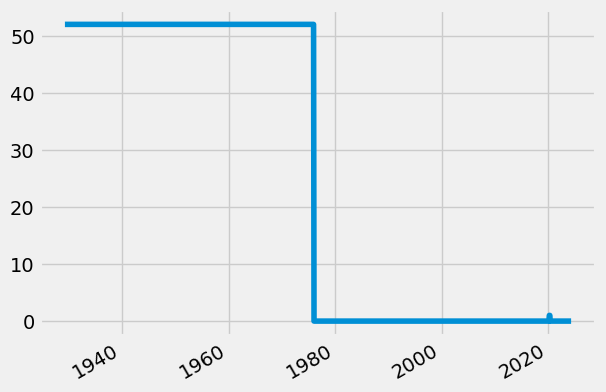

In [65]:
# checking and droping the dates have nan values
unemp_states.isna().sum(axis=1).plot()

In [66]:
unemp_states = unemp_states.dropna()
unemp_states

,CAUR,TXUR,NYUR,FLUR,PAUR,OHUR,MIUR,ALUR,MAUR,NCUR,...,NEUR,CTUR,IDUR,NHUR,RIUR,KSUR,WYUR,DEUR,VTUR,SDUR
1976-01-01,9.2,5.8,10.3,9.7,8.0,8.1,9.9,6.6,10.5,6.4,...,3.3,9.8,5.6,6.5,7.8,4.2,4.1,8.0,8.6,3.3
1976-02-01,9.2,5.8,10.3,9.7,8.1,8.1,9.9,6.6,10.5,6.4,...,3.3,9.8,5.6,6.5,7.8,4.2,4.1,8.0,8.6,3.3
1976-03-01,9.1,5.9,10.2,9.6,8.1,8.1,9.9,6.6,10.5,6.4,...,3.3,9.8,5.6,6.5,7.7,4.2,4.1,8.0,8.6,3.2
1976-04-01,9.1,5.9,10.2,9.5,8.1,8.0,9.8,6.5,10.3,6.3,...,3.2,9.6,5.6,6.5,7.7,4.2,4.0,8.1,8.6,3.1
1976-05-01,9.0,5.9,10.1,9.3,8.1,7.8,9.6,6.4,10.1,6.1,...,3.1,9.4,5.6,6.5,7.7,4.2,3.9,8.3,8.5,3.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,5.1,3.9,4.6,3.1,3.4,3.6,4.1,2.8,3.2,3.6,...,2.5,4.2,3.3,2.6,3.4,2.6,2.9,4.1,2.3,2.1
2024-01-01,5.2,3.9,4.5,3.1,3.4,3.7,4.0,2.9,3.0,3.5,...,2.5,4.4,3.3,2.6,3.6,2.6,2.8,4.1,2.3,2.1
2024-02-01,5.3,3.9,4.4,3.1,3.4,3.7,3.9,3.0,2.9,3.5,...,2.5,4.5,3.3,2.6,3.9,2.7,2.8,4.0,2.3,2.1
2024-03-01,5.3,3.9,4.3,3.2,3.4,3.8,3.9,3.0,2.9,3.5,...,2.5,4.5,3.3,2.6,4.1,2.7,2.8,3.9,2.2,2.1


In [67]:
# plot states uneployement rate
px.line(unemp_states)

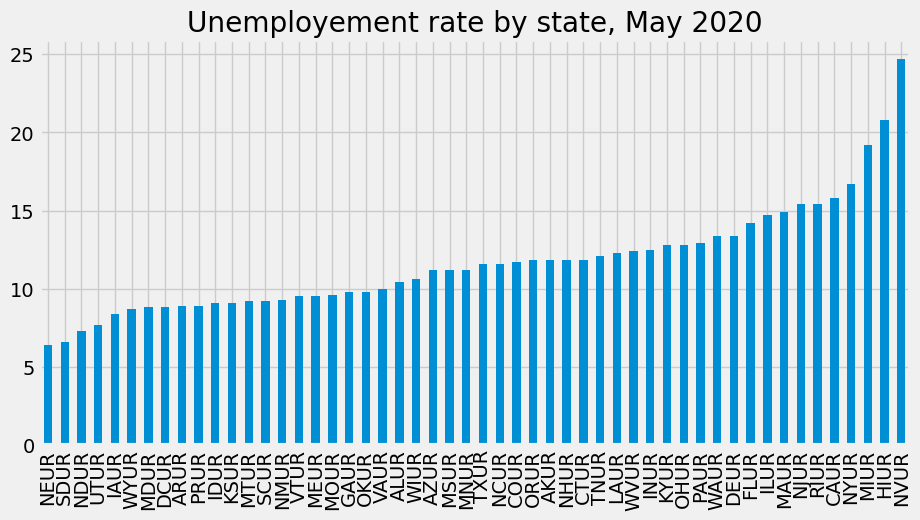

In [80]:
# Pull April 2020 Unemployement rate per state
ax = unemp_states.loc[unemp_states.index == '2020-05-01'].T \
    .sort_values('2020-05-01') \
    .plot(kind='bar', figsize=(10,5), title='Unemployement rate by state, May 2020')

ax.legend().remove()
plt.show()

In [89]:
id_to_state = unemp_df['title'].str.replace("Unemployment Rate in ", "").to_dict()
id_to_state

{'UNRATE': 'Unemployment Rate',
 'LNS14000006': 'Unemployment Rate - Black or African American',
 'CAUR': 'California',
 'TXUR': 'Texas',
 'M0892AUSM156SNBR': 'Unemployment Rate for United States',
 'LNS14000024': 'Unemployment Rate - 20 Yrs. & over',
 'LNS14000031': 'Unemployment Rate - 20 Yrs. & over, Black or African American Men',
 'M0892BUSM156SNBR': 'Unemployment Rate for United States',
 'NYUR': 'New York',
 'U2RATE': 'Unemployment Rate - Job Losers (U-2)',
 'FLUR': 'Florida',
 'LNS14000002': 'Unemployment Rate - Women',
 'LNS14000009': 'Unemployment Rate - Hispanic or Latino',
 'LNS14000003': 'Unemployment Rate - White',
 'PAUR': 'Pennsylvania',
 'OHUR': 'Ohio',
 'LNS14000001': 'Unemployment Rate - Men',
 'LNS14027660': 'Unemployment Rate - High School Graduates, No College, 25 Yrs. & over',
 'MIUR': 'Michigan',
 'LNS14027662': "Unemployment Rate - Bachelor's Degree and Higher, 25 Yrs. & over",
 'ALUR': 'Alabama',
 'LNS14024887': 'Unemployment Rate - 16-24 Yrs.',
 'MAUR': 'Mass

In [95]:
unemp_states.columns = [id_to_state[c] for c in unemp_states.columns]

In [96]:
unemp_states

,California,Texas,New York,Florida,Pennsylvania,Ohio,Michigan,Alabama,Massachusetts,North Carolina,...,Nebraska,Connecticut,Idaho,New Hampshire,Rhode Island,Kansas,Wyoming,Delaware,Vermont,South Dakota
1976-01-01,9.2,5.8,10.3,9.7,8.0,8.1,9.9,6.6,10.5,6.4,...,3.3,9.8,5.6,6.5,7.8,4.2,4.1,8.0,8.6,3.3
1976-02-01,9.2,5.8,10.3,9.7,8.1,8.1,9.9,6.6,10.5,6.4,...,3.3,9.8,5.6,6.5,7.8,4.2,4.1,8.0,8.6,3.3
1976-03-01,9.1,5.9,10.2,9.6,8.1,8.1,9.9,6.6,10.5,6.4,...,3.3,9.8,5.6,6.5,7.7,4.2,4.1,8.0,8.6,3.2
1976-04-01,9.1,5.9,10.2,9.5,8.1,8.0,9.8,6.5,10.3,6.3,...,3.2,9.6,5.6,6.5,7.7,4.2,4.0,8.1,8.6,3.1
1976-05-01,9.0,5.9,10.1,9.3,8.1,7.8,9.6,6.4,10.1,6.1,...,3.1,9.4,5.6,6.5,7.7,4.2,3.9,8.3,8.5,3.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,5.1,3.9,4.6,3.1,3.4,3.6,4.1,2.8,3.2,3.6,...,2.5,4.2,3.3,2.6,3.4,2.6,2.9,4.1,2.3,2.1
2024-01-01,5.2,3.9,4.5,3.1,3.4,3.7,4.0,2.9,3.0,3.5,...,2.5,4.4,3.3,2.6,3.6,2.6,2.8,4.1,2.3,2.1
2024-02-01,5.3,3.9,4.4,3.1,3.4,3.7,3.9,3.0,2.9,3.5,...,2.5,4.5,3.3,2.6,3.9,2.7,2.8,4.0,2.3,2.1
2024-03-01,5.3,3.9,4.3,3.2,3.4,3.8,3.9,3.0,2.9,3.5,...,2.5,4.5,3.3,2.6,4.1,2.7,2.8,3.9,2.2,2.1


In [123]:
# saving data for future use (csv,excel)
unemp_states.to_csv('fred_unemployement_data.csv')
unemp_states.to_csv('fred_unemployement_data.xlsx')

In [97]:
px.line(unemp_states)

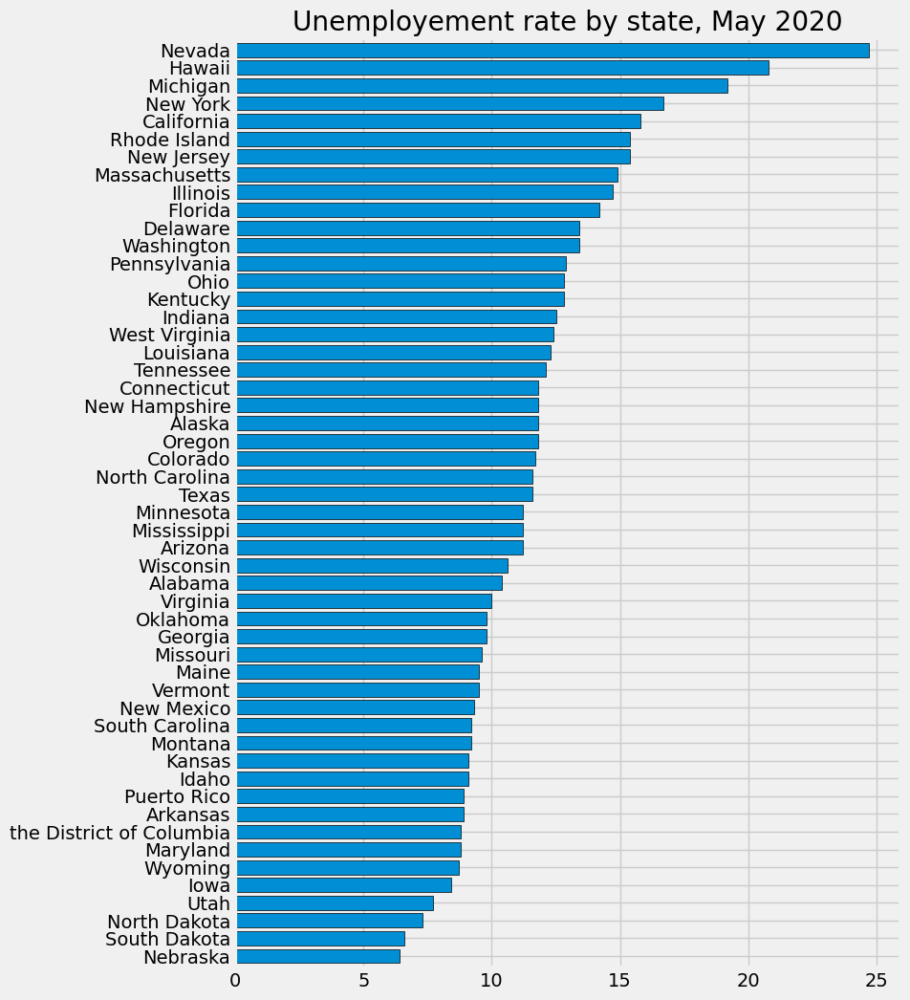

In [104]:
ax = unemp_states.loc[unemp_states.index == '2020-05-01'].T \
    .sort_values('2020-05-01') \
    .plot(kind='barh', figsize=(8,12), width=0.8, edgecolor='black', title='Unemployement rate by state, May 2020')

ax.legend().remove()
plt.show()

In [126]:
# pulling participation rate
# how much % people participate in job VS unemp.

part_df = fred.search('participation rate states', filter=('frequency', 'Monthly'))
part_df = unemp_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"' )
part_df.index[10:20]

Index(['LNS11327662', 'LBSSA06', 'LNS11300028', 'LNS11300031', 'LBSSA01',
       'LNS11300003', 'LNS11327660', 'LBSSA36', 'LNS11300029', 'LBSSA26'],
      dtype='object', name='series id')

In [119]:
# Labor Force Participation Rate for

part_id_to_state = part_df['title'].str.replace("Labor Force Participation Rate for ", "").to_dict()
part_id_to_state


{'CIVPART': 'Labor Force Participation Rate',
 'LNS11300060': 'Labor Force Participation Rate - 25-54 Yrs.',
 'LNS11300002': 'Labor Force Participation Rate - Women',
 'LNS11300001': 'Labor Force Participation Rate - Men',
 'LNS11324230': 'Labor Force Participation Rate - 55 Yrs. & over',
 'LNS11300012': 'Labor Force Participation Rate - 16-19 Yrs.',
 'LNS11300006': 'Labor Force Participation Rate - Black or African American',
 'LRAC25MAUSM156S': 'Infra-Annual Labor Statistics: Labor Force Participation Rate Male: From 25 to 54 Years for United States',
 'LNS11300036': 'Labor Force Participation Rate - 20-24 Yrs.',
 'LRAC25FEUSM156S': 'Infra-Annual Labor Statistics: Labor Force Participation Rate Female: From 25 to 54 Years for United States',
 'LNS11327662': "Labor Force Participation Rate - Bachelor's Degree and Higher, 25 Yrs. & over",
 'LBSSA06': 'California',
 'LNS11300028': 'Labor Force Participation Rate - 20 Yrs. & over, White Men',
 'LNS11300031': 'Labor Force Participation Ra

In [128]:
all_results = []
for myid in part_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)

part_results = pd.concat(all_results, axis=1)

part_results.columns = [part_id_to_state[c] for c in part_results.columns]

In [139]:
# me trying cleaning
ls_unemp_states = list(unemp_states.columns)
# part_results.columns[10:55]
new_df = part_results[ls_unemp_states]
new_df

KeyError: "['Puerto Rico', 'the District of Columbia'] not in index"

In [140]:
# seeing the above error there is no 2 data series present in particiption data
# lets create a set
ls_unemp_states = list(unemp_states.columns)
ls_part_results = list(part_results.columns)
ls_common_states = list(set(ls_unemp_states).intersection(ls_part_results))

In [141]:
len(ls_common_states)

50

In [143]:
part_states = part_results[ls_common_states]

In [144]:
part_states

,South Dakota,Wisconsin,Delaware,Montana,Utah,Wyoming,New York,Mississippi,North Carolina,Louisiana,...,New Jersey,Nevada,Colorado,Connecticut,Minnesota,Michigan,Nebraska,Idaho,Texas,Oklahoma
1948-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1948-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,67.9,65.9,60.8,63.0,69.4,63.6,61.5,53.8,60.7,58.6,...,64.8,62.8,68.3,64.3,68.0,62.3,68.9,62.7,64.2,63.1
2024-01-01,67.8,65.9,60.6,63.0,69.3,63.3,61.4,53.8,60.7,58.7,...,64.6,62.8,68.1,64.4,68.0,62.3,68.8,62.6,64.1,63.2
2024-02-01,67.8,65.7,60.5,63.0,69.2,63.1,61.4,53.7,60.7,58.7,...,64.5,62.8,68.1,64.5,67.9,62.2,68.7,62.6,64.1,63.2
2024-03-01,67.7,65.6,60.3,62.9,69.0,63.0,61.4,53.7,60.6,58.7,...,64.5,62.7,68.0,64.6,68.0,62.3,68.7,62.6,64.1,63.2


In [148]:
# dropping nan values
part_states=part_states.dropna()

In [150]:
# plotting above
px.line(part_states)

In [155]:
# as we need to check unemp vs part lets narrow down to 50 states

# part_df is already 50 so saving this
part_states.to_csv('fred_participation_data_50states.csv')
part_states.to_csv('fred_participation_data_50states.xlsx')

# unemp is already 52 so saving 50
unemp_50states = unemp_states[ls_common_states]
unemp_50states.to_csv('fred_unemployement_data_50states.csv')
unemp_50states.to_csv('fred_unemployement_data_50states.xlsx')
# unemp_50states.shape
# part_states.shape

In [191]:
unemp_50states.shape

(578, 50)

# UNEMPLOYEMENT vs PARTICIPATION

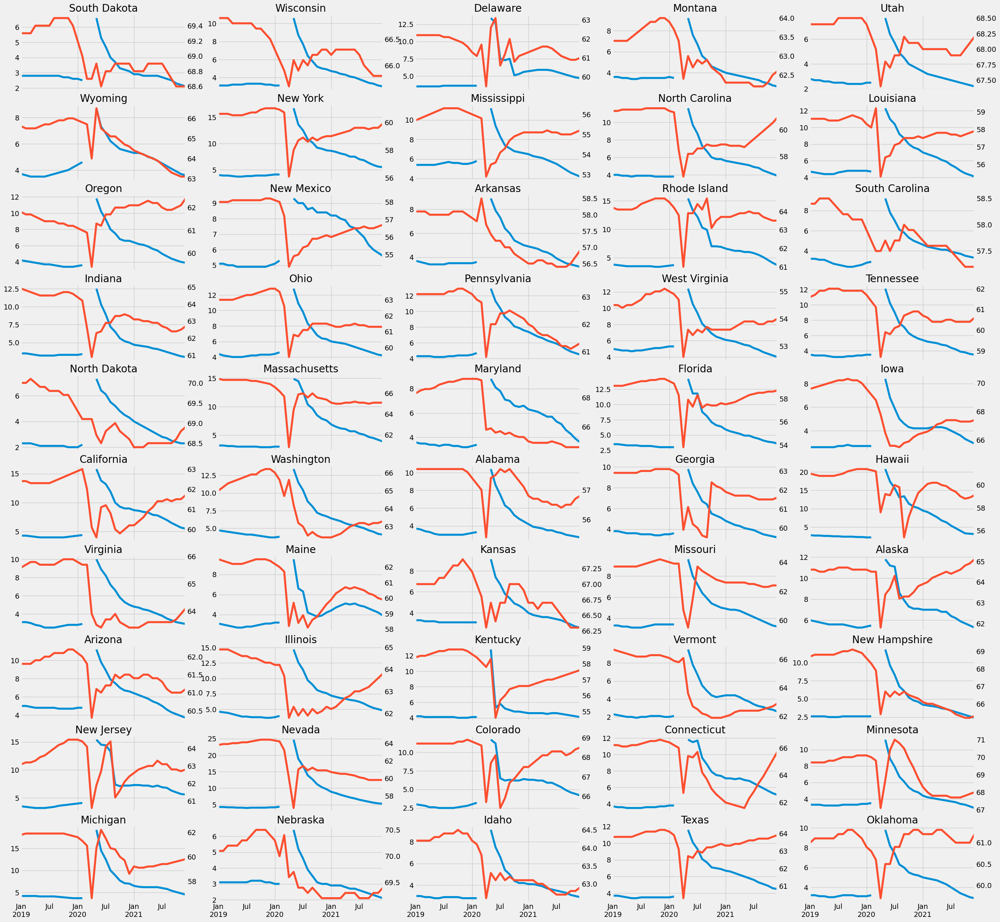

In [230]:
color_pal = plt.rcParams["axes.prop_cycle"].by_key()["color"]

fig, axs = plt.subplots(10,5, figsize=(30,30), sharex=True)
axs = axs.flatten()
uemp_states2 = unemp_50states.asfreq('MS')
i = 0
for state in unemp_50states.columns:
    ax2 = axs[i].twinx()
    uemp_states2.query('index >= 2019 and index < 2022')[state].plot(ax=axs[i], label='unemployement')
    part_states.query('index >= 2019 and index < 2022')[state].plot(ax=ax2, label='participation',color=color_pal[1])
    ax2.grid(False)
    axs[i].set_title(state)
    i+=1
# plt.tight_layout()
plt.show()

# END

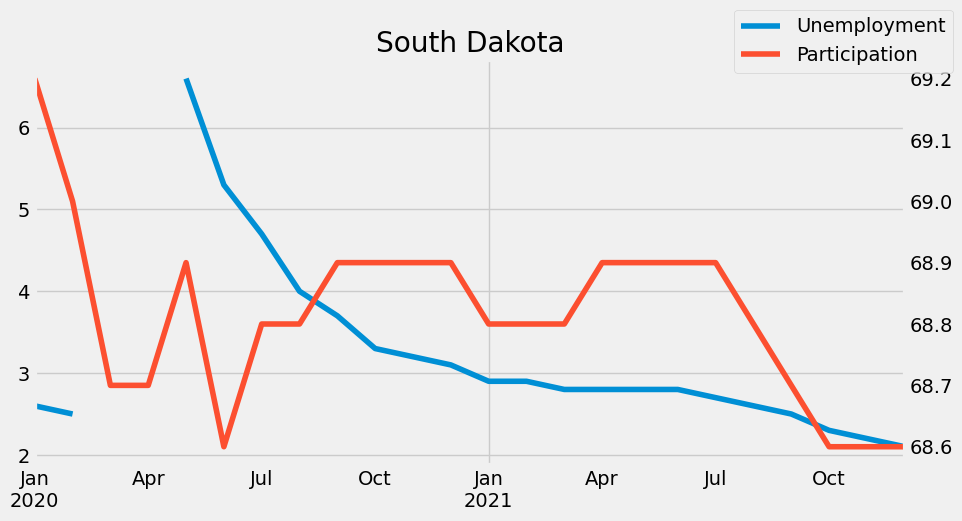

In [199]:
state = 'South Dakota'
fig, ax = plt.subplots(figsize=(10, 5), sharex=True)
ax2 = ax.twinx()
uemp_states2 = unemp_50states.asfreq('MS')
l1 = uemp_states2.query('index >= 2020 and index < 2022')[state] \
    .plot(ax=ax, label='Unemployment')
l2 = part_states.dropna().query('index >= 2020 and index < 2022')[state] \
    .plot(ax=ax2, label='Participation', color=color_pal[1])
ax2.grid(False)
ax.set_title(state)
fig.legend(labels=['Unemployment','Participation'])
plt.show()

Text(0.5, 1.0, 'South Dakota')

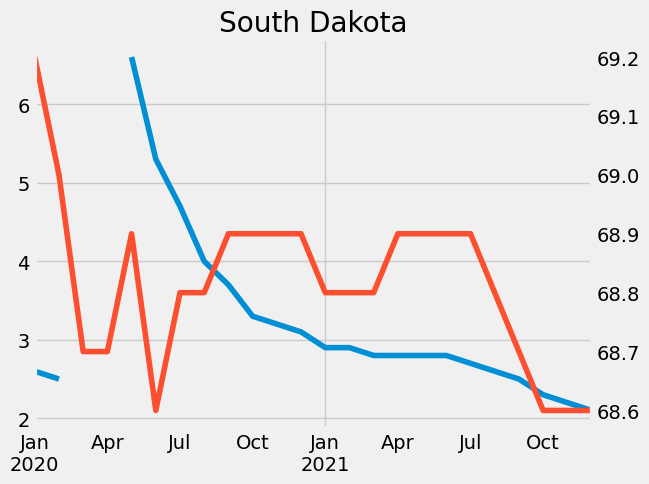

In [228]:
fig, ax1 = plt.subplots()
state = 'South Dakota'
ax2 = ax1.twinx()
# uemp_states2 = unemp_50states.asfreq('MS')
(uemp_states2.query('index >= 2020 and index < 2022')[state]).plot(ax=ax1, label='unemployement')
(part_states.query('index >= 2020 and index < 2022')[state]).plot(ax=ax2, label='participation',color=color_pal[1])


ax2.grid(False)
ax1.set_title(state)


In [218]:
unemp_50states['South Dakota']['2020']

2020-01-01    2.6
2020-02-01    2.5
2020-05-01    6.6
2020-06-01    5.3
2020-07-01    4.7
2020-08-01    4.0
2020-09-01    3.7
2020-10-01    3.3
2020-11-01    3.2
2020-12-01    3.1
Name: South Dakota, dtype: float64

In [220]:
part_states['South Dakota']

1976-01-01    64.6
1976-02-01    64.4
1976-03-01    64.4
1976-04-01    64.3
1976-05-01    64.3
              ... 
2023-12-01    67.9
2024-01-01    67.8
2024-02-01    67.8
2024-03-01    67.7
2024-04-01    67.6
Freq: MS, Name: South Dakota, Length: 580, dtype: float64